<a href="https://colab.research.google.com/github/VintageGold/Music_Generation/blob/main/Music_Generation_LSTM_and_GRU.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<h1>Music generation using Pytorch</h1> by Adam M. Goldstein and Dmitry Pankratov

One of the first papers on music generation using [Deep learning Creating Melodies with Evolving Recurrent Neural Networks](https://http://nn.cs.utexas.edu/downloads/papers/chen.ijcnn01.pdf) was written by Chun-Chi J. Chen et al in 2001. The authors generated a melody with no harmony. The research moved forward since then but even now most approaches towards music generation use only one music channel (mostly piano) and in most cases being train on classical piano melodies. </br>
In our project we used different type of music, Funk music, and tried to teach the models on different music channels (bass, piano ...) in order to pick up different music instruments.

<h2> What is Out There Already?</h2>

[Magenta](https://magenta.tensorflow.org/) Tensor Flow - is the leader in machine learning composition, [Example Piece](https://youtu.be/G5JT16flZwM)


[Microsoft Developers](https://github.com/Azure-Samples/MachineLearning-MusicGeneration)



[Sigurður Skúli Tensor Flow Model](https://github.com/Skuldur/Classical-Piano-Composer), [Article](https://towardsdatascience.com/how-to-generate-music-using-a-lstm-neural-network-in-keras-68786834d4c5)



  


 </br>
<p><b>Project objectives:</b></p>
<ul>
<li>Notebook Adaption - Keras -> PyTorch
<li>Instrument specific training (taking assembled instrument from a midi file like Bass, Piano) --> N generative instrument specific midi tracks.



<p><b>Data:</b></br></p>
<p>For our project we used 45 MIDI files containing Funk grooves and melodies.</p>
<p>Funk music is dance music that mixes rhythm and blues music with soul music. Funk bands use many rhythm instruments, such as electric guitar, bass guitar, drums, and keyboard instruments, mainly synthesizers and electronic organs. In our project we will not be focusing on every instrument but a few of them.</p>

#This Notebook Predicts Generates 2 minutes of audio uses a 10 note sequence.

#This is a Sequential Model so we can use Pytorches LSTM and GRU

#Import Libraries

In [1]:
import os
import glob
from datetime import datetime
from pytz import timezone
import pickle
import numpy
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib

matplotlib.rcParams['figure.figsize'] = (20, 15)


from sklearn.metrics import accuracy_score

#Music specific library
from music21 import converter, instrument, note, chord, stream

#Pytorch
import torch
import torch.utils.data
import torch.utils.data as DataSet
import torch.nn as nn
import torch.nn.functional as F
from torch.autograd import Variable
import torch.optim as optim
from torchvision import datasets
from torchvision import transforms

from keras.utils import np_utils # np_utils.to_categorical function

#Google Mount
from google.colab import drive
drive.mount('/content/drive/')

%cd drive/My\ Drive/Final_Project_Goldstein_Pankratov/

from tqdm.autonotebook import tqdm

#External scripts will sit the Libraries folder
import sys
sys.path.append('/content/drive/My Drive/Final_Project_Goldstein_Pankratov/Generation/Libraries/')

from mpdl import train_network, set_seed, LastTimeStep

Mounted at /content/drive/
/content/drive/My Drive/Final_Project_Goldstein_Pankratov


In [2]:
#Utilities
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu") 
set_seed(42)

#Global Current Time
est = timezone('EST')
current_time = datetime.now(est)

#EDA

In [3]:
df = pd.read_csv('Metadata/Metadata.csv')

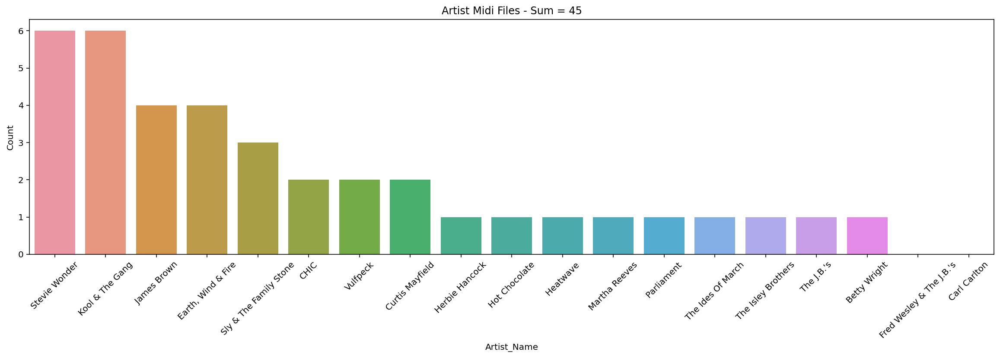

In [4]:
artist_total = df[['Target','Artist_Name']].groupby('Artist_Name').count().sort_values('Target',ascending=False)

fig, ax = plt.subplots(figsize=(20,5))
sns.barplot(x=artist_total.index, y='Target',data=artist_total)
plt.ylabel('Count')
plt.title(f'Artist Midi Files - Sum = {len(df)}')
_ = plt.xticks(rotation=45)

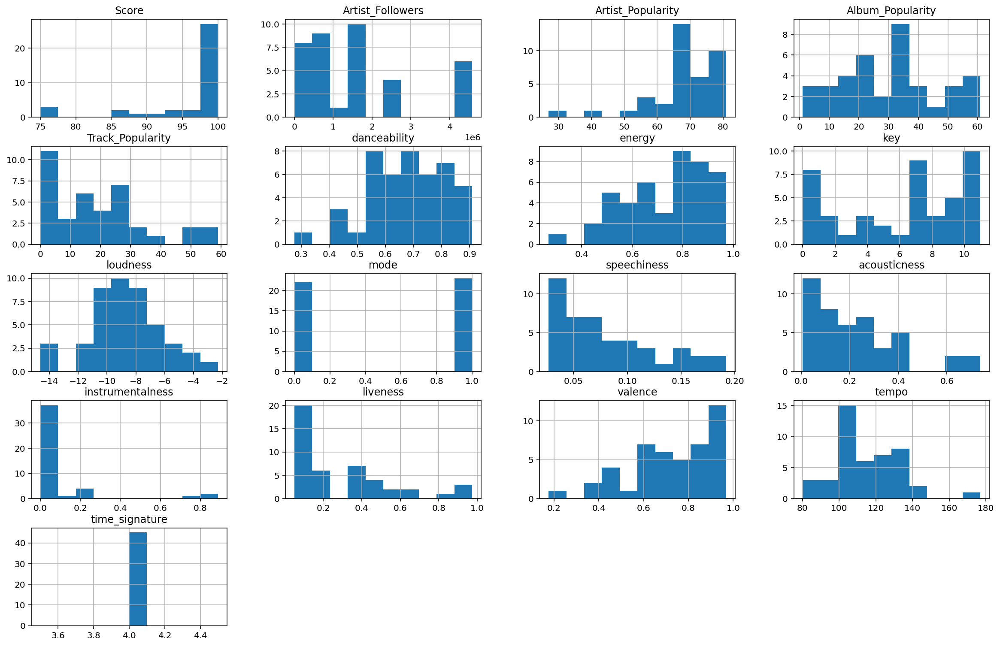

In [5]:
_ = df.hist(figsize=(20,13))

#Individual File View

In [6]:
for f in glob.glob("Data/Midi/Stevie Wonder_Superstitions.mid"):

    instr = 'bass'

    notes = []
    
    midi = converter.parse(f)

    print("Parsing %s" % f)

    notes_to_parse = None

    s2 = instrument.partitionByInstrument(midi)
    for x in range(len(s2)):
        if instr in str(s2.parts[x].recurse()).lower():
            notes_to_parse = s2.parts[x].recurse()

    for element in notes_to_parse:
        if isinstance(element, note.Note):
            notes.append(str(element.pitch))
        elif isinstance(element, chord.Chord):
            notes.append('.'.join(str(n) for n in element.normalOrder))


Parsing Data/Midi/Stevie Wonder_Superstitions.mid


In [7]:
def get_octaves(note):
    if len(note) > 2:
        return note[2]
    else:
        return note[1]

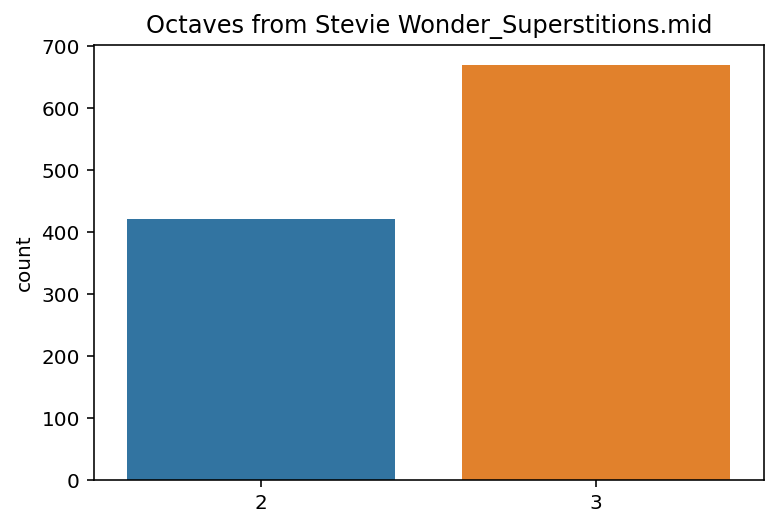

In [8]:
_ = sns.countplot(x=[get_octaves(note) for note in notes])
_ = plt.title('Octaves from Stevie Wonder_Superstitions.mid')

Text(0.5, 1.0, 'Notes from Stevie Wonder_Superstitions.mid')

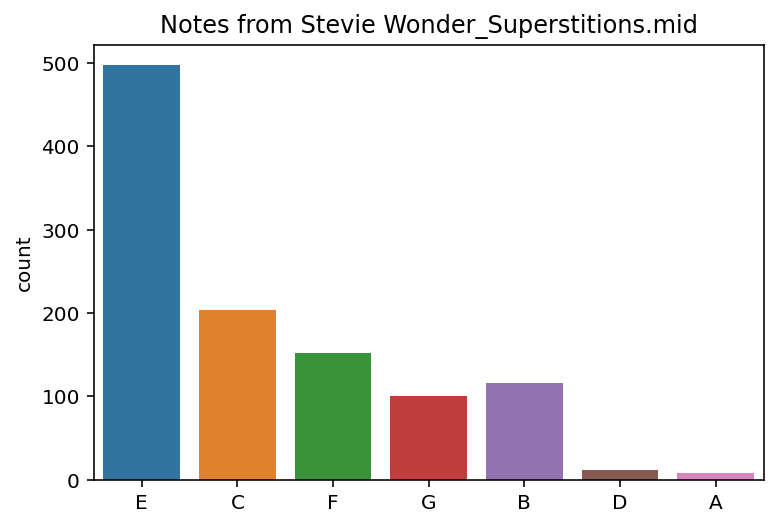

In [9]:
notes_plot = sns.countplot(x=[kind[0] for kind in notes])
plt.title('Notes from Stevie Wonder_Superstitions.mid')

Text(0.5, 1.0, 'Specific Notes from Stevie Wonder_Superstitions.mid')

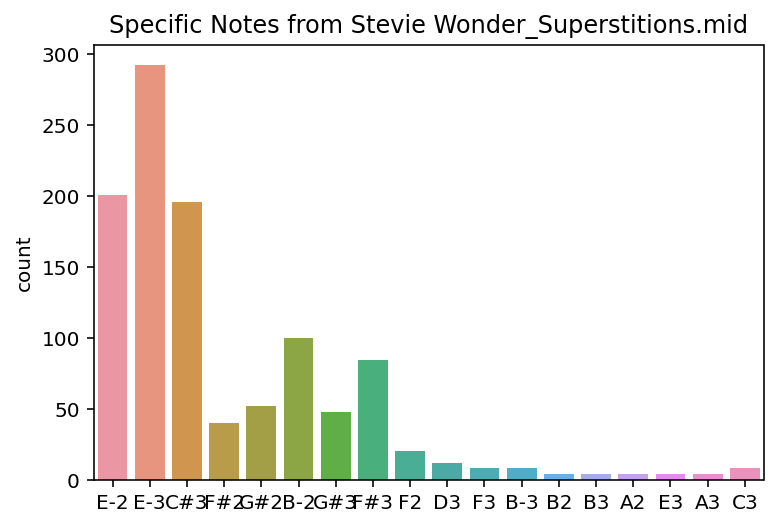

In [10]:
notes_plot = sns.countplot(x=[kind for kind in notes])
plt.title('Specific Notes from Stevie Wonder_Superstitions.mid')

#Models

In [11]:
def S_train_network(instr,t=True):
    
    """ Prepares the data."""
    
    notes, songs = get_notes(instr)

    # get amount of pitch names
    n_vocab = len(set(notes))

    network_input, network_output = prepare_sequences(notes, n_vocab)

    return network_input, network_output, n_vocab, notes, songs

#Prepare Data

In [12]:
#Adapted from Sigurður Skúli Tensor Flow Model, Article
def get_notes(instr):
    
    """ Extracts all notes and chords from midi files in the ./midi_songs 
    directory and creates a file with all notes in string format"""
    notes = []
    songs = []
    midi_files = []

    for f in glob.glob("Data/Midi/*.mid"):
        midi_files.append(f)

    midi_files.sort()

    for f in tqdm(midi_files):
        
        midi = converter.parse(f)

        #print("Parsing %s" % f)

        notes_to_parse = None

        try: # file has instrument parts
            s2 = instrument.partitionByInstrument(midi)
            for x in range(len(s2)):
                if instr in str(s2.parts[x].recurse()).lower():
                    notes_to_parse = s2.parts[x].recurse()
                    songs.append({'Files': f, 'Instrument': s2.parts[x].recurse()})
                    
        except: # file has notes in a flat structure
            print(f, ' - ','Notes Are Flat No Instrument Found')
            continue
        
        if not notes_to_parse:
            continue

        for element in notes_to_parse:
            if isinstance(element, note.Note):
                notes.append(str(element.pitch))
            elif isinstance(element, chord.Chord):
                notes.append('.'.join(str(n) for n in element.normalOrder))

    with open(f'Data/{instr}-notes', 'wb') as filepath:
        pickle.dump(notes, filepath)

    return notes, pd.DataFrame(songs)

In [13]:
#Adapted from Sigurður Skúli Tensor Flow Model, Article
def prepare_sequences(notes, n_vocab):
    
    """ Prepare the sequences which are the inputs for the LSTM """
    
    sequence_length = 10

    # getting all pitch names
    pitchnames = sorted(set(item for item in notes))

    # creating a dictionary to map pitches to ints
    note_to_int = dict((note, number) for number, note in enumerate(pitchnames))

    network_input = []
    network_output = []

    # create input sequences and the corresponding outputs
    for i in range(0, len(notes) - sequence_length, 1):
        sequence_in = notes[i:i + sequence_length]
        sequence_out = notes[i + sequence_length]
        network_input.append([note_to_int[char] for char in sequence_in])
        network_output.append(note_to_int[sequence_out])

    n_patterns = len(network_input)

    # reshape the input into a format compatible with LSTM layers
    network_input = numpy.reshape(network_input, (n_patterns,1,sequence_length))
    # normalize input
    network_input = network_input / float(n_vocab)

    network_output = np_utils.to_categorical(network_output)

    return (network_input, network_output)

#Network

In [14]:
def generate_model(model_name,instr,network_input,network_output,n_vocab
                   ,batch_size = 256, epochs = 100, n = 1024,num_layers = 2
                   ,dropout = 0.3, learning_rate = 0.8,loss_func = nn.CrossEntropyLoss()):
    
    #Dataset
    batch_size = batch_size

    datasets = DataSet.TensorDataset(torch.FloatTensor(network_input), torch.LongTensor(network_output))
    train_loader = DataSet.DataLoader(datasets, batch_size=batch_size, shuffle=False)

    if model_name.upper() == 'LSTM':
        
        #LSTM
        model = nn.Sequential(
        nn.LSTM(network_input[0].size, n, num_layers=num_layers, dropout=dropout, batch_first=True), 
        LastTimeStep(rnn_layers=num_layers), #We need to take the RNN output and reduce it to one item, (B, D)
        nn.Linear(n, n_vocab), #(B, D) -> (B, classes))
        )

        #Checkpoint path
        path = f'Weights/{instr.lower()}/LSTM/{current_time}/'
        os.mkdir(path)
        checkpoint_file =  path +  f'LSTM-{instr}-{current_time}-model.pt'
        print(checkpoint_file)

    elif model_name.upper() == 'GRU':

        #GRU
        model = nn.Sequential(
        nn.GRU(network_input[0].size, n, num_layers=num_layers, dropout=dropout, batch_first=True), 
        LastTimeStep(rnn_layers=num_layers), #We need to take the RNN output and reduce it to one item, (B, D)
        nn.Linear(n, n_vocab), #(B, D) -> (B, classes)
        )

        #Checkpoint path
        path = f'Weights/{instr.lower()}/GRU/{current_time}/'
        os.mkdir(path)
        checkpoint_file =  path +  f'GRU-{instr}-{current_time}-model.pt'
        print(checkpoint_file)

    #Parameters
    epochs = epochs
    n = n
    num_layers = num_layers
    dropout = dropout
    learning_rate = learning_rate
    loss_func = loss_func

    optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)

    model_results = (train_network(model, loss_func, train_loader,
                                score_funcs={'Accuracy': accuracy_score}, optimizer=optimizer, device=device,
                                epochs=epochs, checkpoint_file=checkpoint_file))
    return model_results

#Input

In [15]:
n = 1024
num_layers = 2
dropout = 0.3

In [16]:
instr_list = ['bass','piano']

instr_dict = {}

for instr in instr_list:

    print('Preprocessing:',instr)

    network_input, network_output, n_vocab, notes, songs = S_train_network(instr)
    
    instr_dict.update({instr:{'network_input':network_input,'network_output':network_output
                       ,'n_vocab':n_vocab, 'notes':notes, 'songs':songs}})

Preprocessing: bass


Data/Midi/CHIC_Good Times.mid  -  Notes Are Flat No Instrument Found
Data/Midi/Kool And The Gang_Fresh.mid  -  Notes Are Flat No Instrument Found

Preprocessing: piano


Data/Midi/CHIC_Good Times.mid  -  Notes Are Flat No Instrument Found
Data/Midi/Kool And The Gang_Fresh.mid  -  Notes Are Flat No Instrument Found



In [17]:
LSTM_results = generate_model('LSTM','bass',instr_dict['bass']['network_input']
                              
                              ,instr_dict['bass']['network_output'],instr_dict['bass']['n_vocab']

                              ,batch_size = 256, epochs = 400, n = 1024, num_layers = 2
                              
                              ,dropout = 0.3, learning_rate = 0.8, loss_func = nn.CrossEntropyLoss())


GRU_results = generate_model('GRU','bass',instr_dict['bass']['network_input']
                             
                             ,instr_dict['bass']['network_output'],instr_dict['bass']['n_vocab']

                             ,batch_size = 256, epochs =400, n = 1024, num_layers = 2

                             ,dropout = 0.3, learning_rate = 0.8, loss_func = nn.CrossEntropyLoss())

Weights/bass/LSTM/2021-02-04 18:50:36.892330-05:00/LSTM-bass-2021-02-04 18:50:36.892330-05:00-model.pt



Weights/bass/GRU/2021-02-04 18:50:36.892330-05:00/GRU-bass-2021-02-04 18:50:36.892330-05:00-model.pt


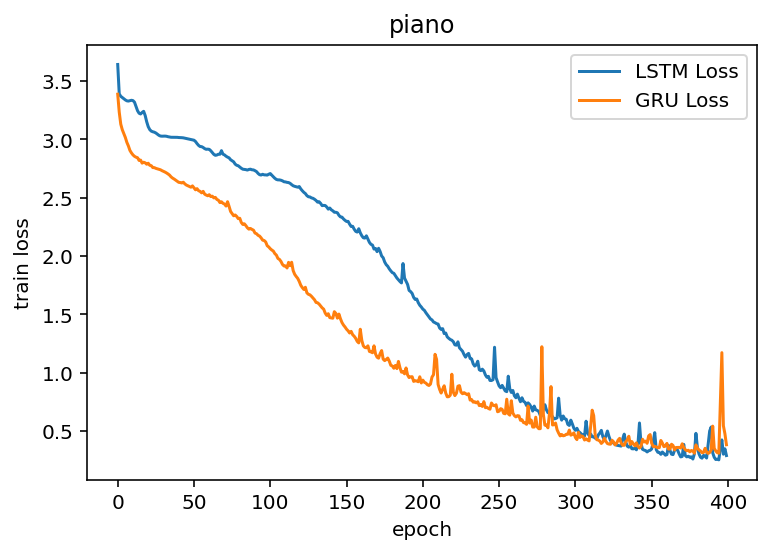

In [18]:
sns.lineplot(x='epoch', y='train loss', data=LSTM_results, label='LSTM Loss');
sns.lineplot(x='epoch', y='train loss', data=GRU_results, label='GRU Loss');
plt.title(f'{instr}');

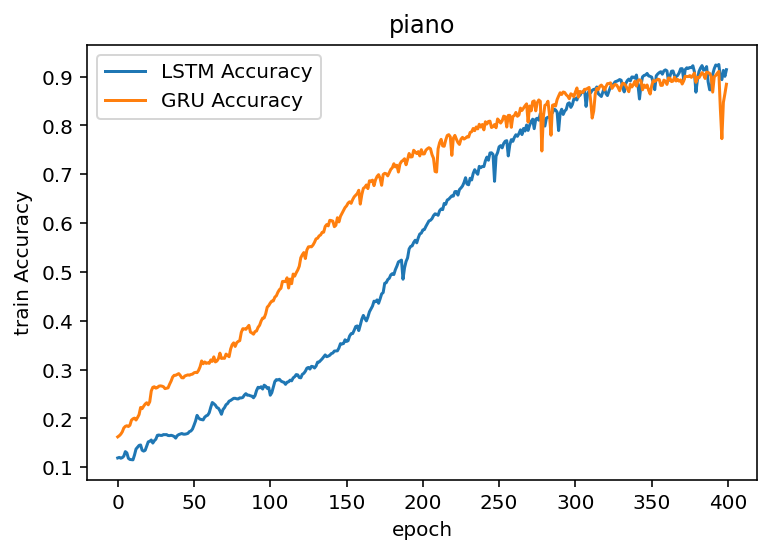

In [19]:
sns.lineplot(x='epoch', y='train Accuracy', data=LSTM_results, label='LSTM Accuracy');
sns.lineplot(x='epoch', y='train Accuracy', data=GRU_results, label='GRU Accuracy');
plt.title(f'{instr}');

In [20]:
LSTM_results = generate_model('LSTM','piano',instr_dict['piano']['network_input']
                              
                              ,instr_dict[instr]['network_output'],instr_dict['piano']['n_vocab']   

                              ,batch_size = 256, epochs = 400 , n = 1024, num_layers = 2
                              
                              ,dropout = 0.3, learning_rate = 0.8, loss_func = nn.CrossEntropyLoss())


GRU_results = generate_model('GRU','piano',instr_dict[instr]['network_input']
                             
                             ,instr_dict[instr]['network_output'],instr_dict['piano']['n_vocab'] 

                             ,batch_size = 256,epochs = 400, n = 1024, num_layers = 2 
                             
                             ,dropout = 0.3, learning_rate = 0.8, loss_func = nn.CrossEntropyLoss())

Weights/piano/LSTM/2021-02-04 18:50:36.892330-05:00/LSTM-piano-2021-02-04 18:50:36.892330-05:00-model.pt



Weights/piano/GRU/2021-02-04 18:50:36.892330-05:00/GRU-piano-2021-02-04 18:50:36.892330-05:00-model.pt


In [21]:
bass_LSTM_results = LSTM_results.iloc[-1][['epoch','train Accuracy','train loss']].to_list()
print('LSTM: ',bass_LSTM_results)
bass_GRU_results = GRU_results.iloc[-1][['epoch','train Accuracy','train loss']].to_list()
print('GRU: ',bass_LSTM_results)

LSTM:  [399.0, 0.9239976925295644, 0.24204923720163113]
GRU:  [399.0, 0.9239976925295644, 0.24204923720163113]


,epoch,total time,train loss,train Accuracy
399,399,532.448427,0.242049,0.923998


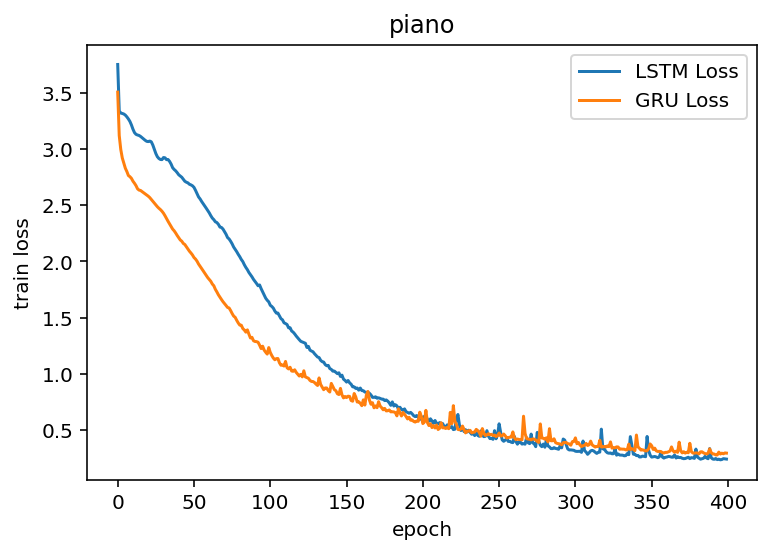

In [22]:
sns.lineplot(x='epoch', y='train loss', data=LSTM_results, label='LSTM Loss');
sns.lineplot(x='epoch', y='train loss', data=GRU_results, label='GRU Loss');
plt.title(f'{instr}');

LSTM_results.tail(1)

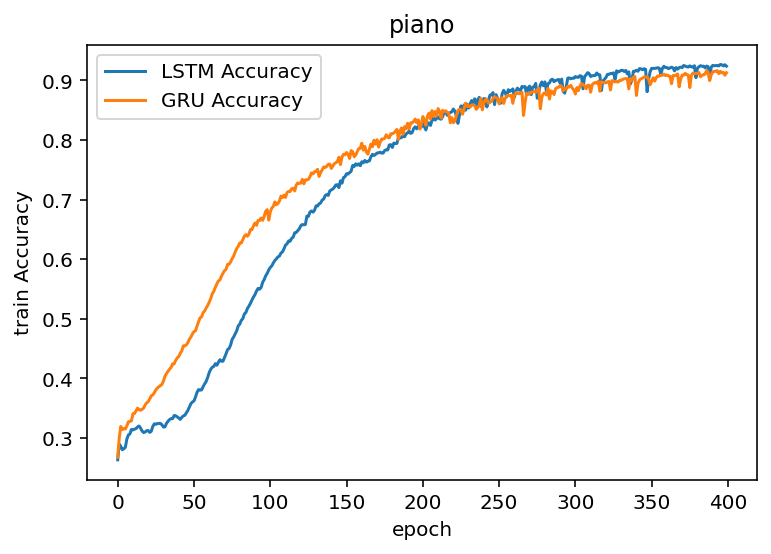

In [23]:
sns.lineplot(x='epoch', y='train Accuracy', data=LSTM_results, label='LSTM Accuracy');
sns.lineplot(x='epoch', y='train Accuracy', data=GRU_results, label='GRU Accuracy');
plt.title(f'{instr}');

In [24]:
piano_LSTM_results = LSTM_results.iloc[-1][['epoch','train Accuracy','train loss']].to_list()
print('LSTM: ',piano_LSTM_results)
piano_GRU_results = GRU_results.iloc[-1][['epoch','train Accuracy','train loss']].to_list()
print('GRU: ',bass_LSTM_results)

LSTM:  [399.0, 0.9239976925295644, 0.24204923720163113]
GRU:  [399.0, 0.9239976925295644, 0.24204923720163113]


#Generation

In [25]:
#Adapted from Sigurður Skúli Tensor Flow Model, Article
def generate(instr):
    """ Generates the midi file """
    #load the notes used to train the model
    with open(f'Data/{instr}-notes', 'rb') as filepath:
        notes = pickle.load(filepath)

    # Get all pitch names
    pitchnames = sorted(set(item for item in notes))
    # Get all pitch names
    n_vocab = len(set(notes))

    network_input, normalized_input = prepare_sequences(notes, pitchnames, n_vocab)
    
    return network_input, normalized_input, n_vocab, pitchnames

In [26]:
#Adapted from Sigurður Skúli Tensor Flow Model, Article
def prepare_sequences(notes, pitchnames, n_vocab):
    
    """ Prepare the sequences used by the Neural Network """
    
    # map back from integers to notes
    note_to_int = dict((note, number) for number, note in enumerate(pitchnames))

    sequence_length = 10
    network_input = []
    output = []
    for i in range(0, len(notes) - sequence_length, 1):
        sequence_in = notes[i:i + sequence_length]
        sequence_out = notes[i + sequence_length]
        network_input.append([note_to_int[char] for char in sequence_in])
        output.append(note_to_int[sequence_out])

    n_patterns = len(network_input)

    # reshape the input into a format compatible with LSTM layers
    normalized_input = numpy.reshape(network_input, (n_patterns,1,sequence_length))
    # normalize input
    normalized_input = normalized_input / float(n_vocab)

    return (network_input, normalized_input)

In [27]:
#Adapted from Sigurður Skúli Tensor Flow Model, Article
def generate_notes(model, network_input, pitchnames, n_vocab):
    
    """ Generate notes from the neural network based on a sequence of notes """
    
    # pick a random sequence from the input as a starting point for the prediction
    start = numpy.random.randint(0, len(network_input)-1)

    int_to_note = dict((number, note) for number, note in enumerate(pitchnames))

    pattern = network_input[start]
    prediction_output = []
    #print(type(pattern))

    # generate 500 notes
    for note_index in range(500):
        prediction_input = numpy.reshape(pattern, (1,1,len(pattern)))
        numpy_prediction_input = numpy.array(prediction_input,dtype=numpy.float32)
        
        prediction_input = numpy_prediction_input / float(n_vocab)
        prediction_input = torch.from_numpy(numpy_prediction_input)
        prediction = model(prediction_input)
        
        index = torch.argmax(prediction) # numpy array of predictions
        result = int_to_note[index.item()] # indexing the note with the highest probability
        prediction_output.append(result) # that note is the prediction output
        
        pattern.append(index)
        pattern = pattern[1:len(pattern)]
        
    return prediction_output

In [28]:
#Adapted from Sigurður Skúli Tensor Flow Model, Article
def create_midi(prediction_output,model_type,f_pass_results):
    
    """ Converts the output from the prediction to notes and create a midi file
        from the notes """
    
    offset = 0
    output_notes = []

    # create note and chord objects based on the values generated by the model
    for pattern in prediction_output:
        # pattern is a chord
        if ('.' in pattern) or pattern.isdigit():
            notes_in_chord = pattern.split('.')
            notes = []
            for current_note in notes_in_chord:
                new_note = note.Note(int(current_note))
                new_note.storedInstrument = instrument.SnareDrum()
                notes.append(new_note)
            new_chord = chord.Chord(notes)
            new_chord.offset = offset
            output_notes.append(new_chord)
        # pattern is a note
        else:
            new_note = note.Note(pattern)
            new_note.offset = offset
            new_note.storedInstrument = instrument.SnareDrum()
            output_notes.append(new_note)

        # increase offset each iteration so that notes do not stack
        offset += 0.5

    midi_stream = stream.Stream(output_notes)

    #Output File is in this naming: Model_Type_Instrument_Epoch_Accuracy_Loss

    #Global Current Time
    est = timezone('EST')
    build_time = datetime.now(est)
    
    try:
        path = os.mkdir(f'Generation/{instr}/{model_type}/{current_time}/')
        midi_stream.write('midi', fp=f'{path}+{f_pass_results[0]}_{f_pass_results[1]}_{f_pass_results[2]}_{current_time}_{build_time}.mid')
    except:
        midi_stream.write('midi', fp=f'Generation/{instr}/{model_type}/{current_time}/{f_pass_results[0]}_{f_pass_results[1]}_{f_pass_results[2]}_{current_time}_{build_time}.mid')

##LSTM - Midi Generation

In [29]:
#Loop through instruments and generate 4 files, 2 instruments * 2 Models

for w in range(4):

    for instr in instr_list:    
        
        #Generate input size and parameters needed for model generation
        network_input, normalized_input, n_vocab, pitchnames = generate(instr)

        #Load LSTM model state
        new_lstm = nn.Sequential(
        nn.LSTM(normalized_input[0].size, n, num_layers=num_layers, dropout=dropout, batch_first=True), 
        LastTimeStep(rnn_layers=num_layers), #We need to take the RNN output and reduce it to one item, (B, D)
        nn.Linear(n, n_vocab), #(B, D) -> (B, classes))
        )

        #current_time = '2020-12-05 14:32:21.288391-05:00' 
        #current_time = '2020-12-06 08:33:27.017462-05:00'

        checkpoint_dict = torch.load(f'Weights/{instr}/LSTM/{current_time}/LSTM-{instr}-{current_time}-model.pt', map_location=device)

        new_lstm.load_state_dict(checkpoint_dict['model_state_dict'])

        #Predict and Create LSTM Midi Output
        
        if instr == 'bass':
            pass_results = bass_LSTM_results
        elif instr == 'piano':
            pass_results = piano_LSTM_results

        #Output File is in this naming: Model_Type_instrument_Accuracy_Loss
        prediction_output = generate_notes(new_lstm, network_input, pitchnames, n_vocab)
        create_midi(prediction_output,'LSTM',pass_results)

## GRU - Midi Generation

In [30]:
for w in range(4):

    for instr in instr_list: 
        #Generate input size and parameters needed for model generation
        network_input, normalized_input, n_vocab, pitchnames = generate(instr)
        
        #Load GRU model state
        new_gru = nn.Sequential(
        nn.GRU(normalized_input[0].size, n, num_layers=num_layers, dropout = dropout, batch_first=True), 
        LastTimeStep(rnn_layers=num_layers), #We need to take the RNN output and reduce it to one item, (B, D)
        nn.Linear(n, n_vocab), #(B, D) -> (B, classes)
        )

        checkpoint_dict = torch.load(f'Weights/{instr}/GRU/{current_time}/GRU-{instr}-{current_time}-model.pt', map_location=device) 

        new_gru.load_state_dict(checkpoint_dict['model_state_dict'])

        #Predict and Create Midi Output
        if instr == 'bass':
            pass_results = bass_GRU_results
        elif instr == 'piano':
            pass_results = piano_GRU_results
        
        #Output File is in this naming - Model_Type_instrument_Accuracy_Loss
        prediction_output = generate_notes(new_gru, network_input, pitchnames, n_vocab)
        create_midi(prediction_output,'GRU',pass_results)

# References

- Music21 Documentation: http://web.mit.edu/music21/doc/index.html
- PyTorch Documentation: https://pytorch.org/docs/stable/index.html
- Classical Piano Composer: https://github.com/Skuldur/Classical-Piano-Composer
- Lyrics and piano music generation in Pytorch: https://github.com/warmspringwinds/pytorch-rnn-sequence-generation-classification
- Music Generation with Azure Machine Learning: https://github.com/Azure-Samples/MachineLearning-MusicGeneration